In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/places365/val_256/"
x = load(os.path.join(path, 'train_samples/Places365_val_00000130.jpg'))
print(x.shape)

(256, 256, 3)


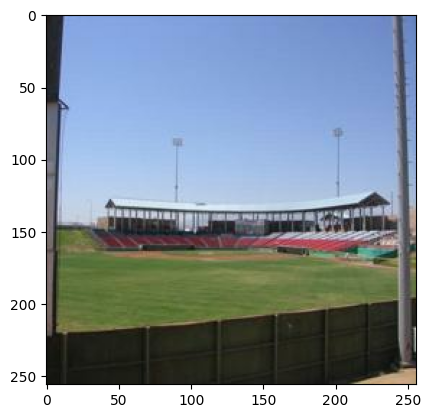

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

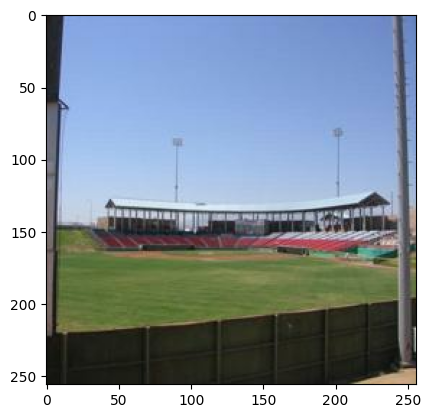

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

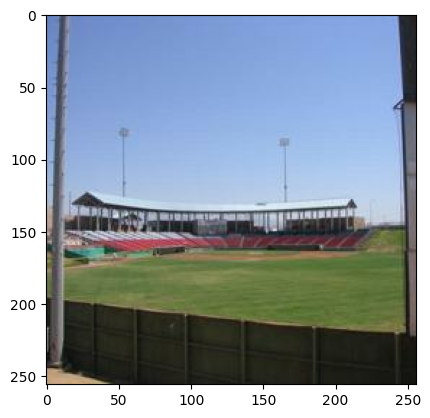

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

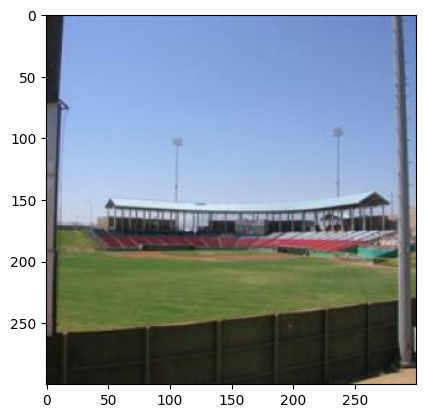

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "/train_samples/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.take(8000)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

500

In [21]:
# create input pipeline
val = tf.data.Dataset.list_files(path + "/valid_samples/*.jpg")
val = val.map(load_test_image)
val = val.take(1000)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 128, 128, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 256, 256, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

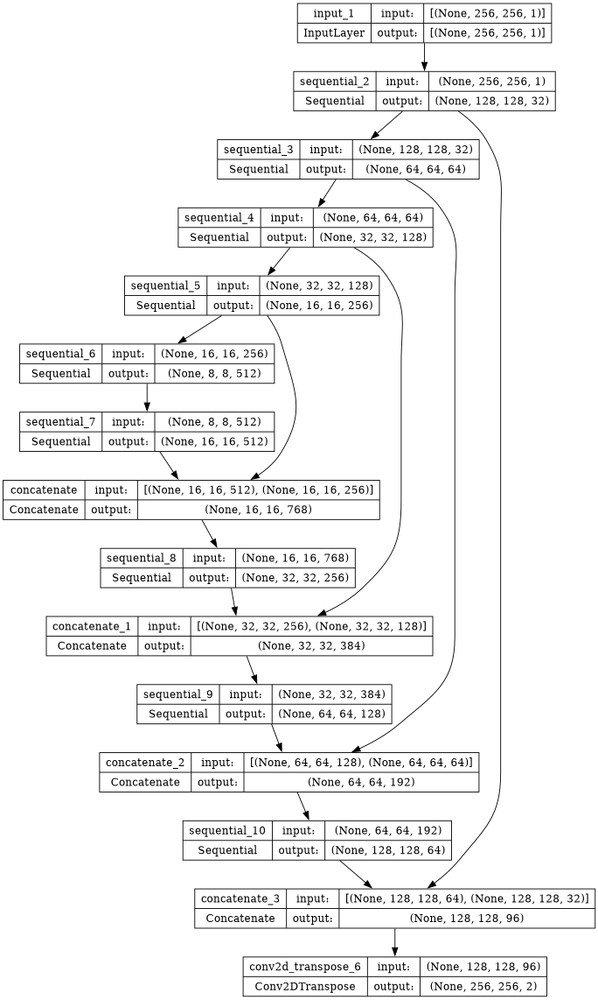

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
gen.load_weights('/kaggle/input/feb21-flexible-resizeplaces365/modelsFeb7/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

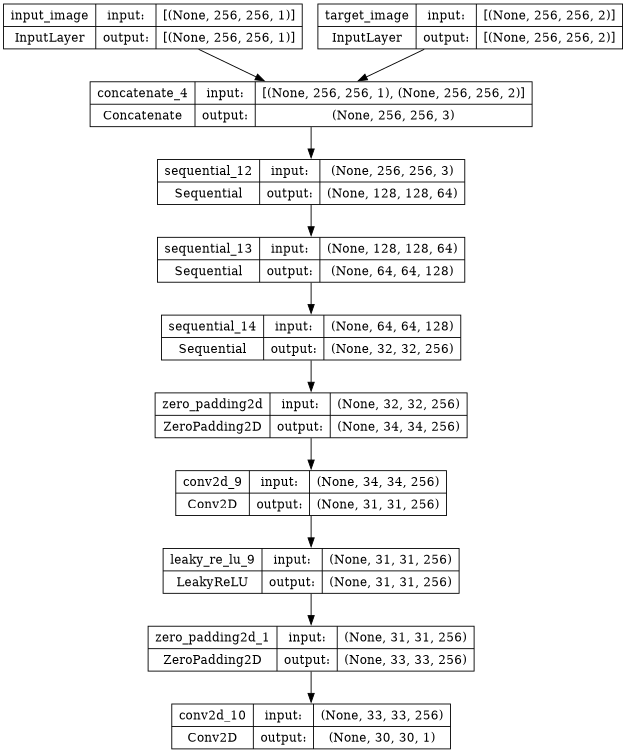

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
disc.load_weights('/kaggle/input/feb21-flexible-resizeplaces365/modelsFeb7/disc_wweight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 150

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


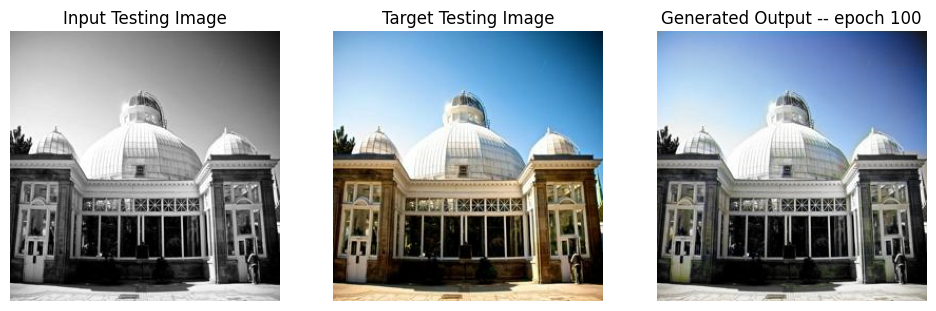

SSIM Score: 0.9517235159873962
PSNR Score: 24.3391170501709


In [47]:
display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000547.jpg',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000547.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 3s 0us/step
Training Details
Generator-- total_loss:9.14354 gan_loss:1.12112 l1_loss:0.04512 perceptual_loss:0.00837 Discriminator-- total_loss:1.43182 real_loss:0.69889 generated_loss:0.73293 --- SSIM 0.90871 PSNR 22.28007 LPIPS 0.00000
Time taken for epoch 1 is 609.4071023464203 sec
Number of iteration 500
Validation Details
Generator-- total_loss:12.58612 gan_loss:0.50854 l1_loss:0.06944  perceptual_loss:0.01107 Discriminator-- total_loss:2.81681 real_loss:2.05598 generated_loss:0.76083 --- SSIM 0.87216 PSNR 18.64561 LPIPS 0.00000
Time taken for epoch 1 is 651.2227373123169 sec
Number of iteration 63
Displaying one random test image...


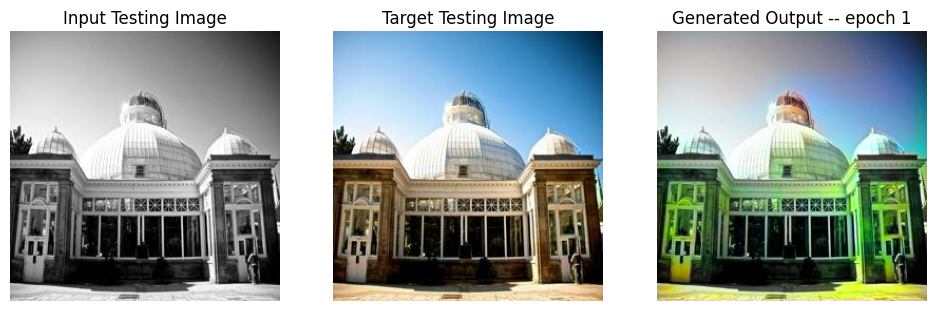

SSIM Score: 0.9062726497650146
PSNR Score: 19.146799087524414
Epoch 1
Training Details
Generator-- total_loss:8.99185 gan_loss:1.06683 l1_loss:0.04463 perceptual_loss:0.00820 Discriminator-- total_loss:1.22325 real_loss:0.58151 generated_loss:0.64174 --- SSIM 0.91323 PSNR 22.34406 LPIPS 0.00000
Time taken for epoch 2 is 600.0048196315765 sec
Number of iteration 500
Validation Details
Generator-- total_loss:9.91409 gan_loss:0.66203 l1_loss:0.05291  perceptual_loss:0.00878 Discriminator-- total_loss:1.47399 real_loss:0.93357 generated_loss:0.54042 --- SSIM 0.91732 PSNR 21.76017 LPIPS 0.00000
Time taken for epoch 2 is 640.8452594280243 sec
Number of iteration 63
Epoch 2
Training Details
Generator-- total_loss:8.91597 gan_loss:1.09085 l1_loss:0.04410 perceptual_loss:0.00807 Discriminator-- total_loss:1.20540 real_loss:0.57435 generated_loss:0.63105 --- SSIM 0.91614 PSNR 22.50329 LPIPS 0.00000
Time taken for epoch 3 is 600.0267715454102 sec
Number of iteration 500
Validation Details
Generat

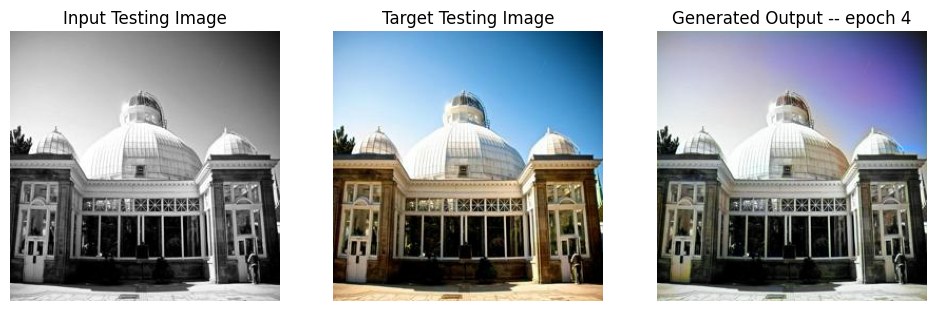

SSIM Score: 0.937397301197052
PSNR Score: 21.3698673248291
Epoch 4
Training Details
Generator-- total_loss:8.97698 gan_loss:1.11094 l1_loss:0.04439 perceptual_loss:0.00805 Discriminator-- total_loss:1.21041 real_loss:0.57351 generated_loss:0.63691 --- SSIM 0.91497 PSNR 22.50776 LPIPS 0.00000
Time taken for epoch 5 is 597.2886579036713 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.50414 gan_loss:0.37499 l1_loss:0.04537  perceptual_loss:0.00882 Discriminator-- total_loss:1.59203 real_loss:1.25948 generated_loss:0.33255 --- SSIM 0.93060 PSNR 22.92107 LPIPS 0.00000
Time taken for epoch 5 is 637.0325610637665 sec
Number of iteration 63
Epoch 5
Training Details
Generator-- total_loss:8.90936 gan_loss:1.11853 l1_loss:0.04393 perceptual_loss:0.00801 Discriminator-- total_loss:1.19024 real_loss:0.57040 generated_loss:0.61985 --- SSIM 0.91614 PSNR 22.53847 LPIPS 0.00000
Time taken for epoch 6 is 598.0822134017944 sec
Number of iteration 500
Validation Details
Generator-

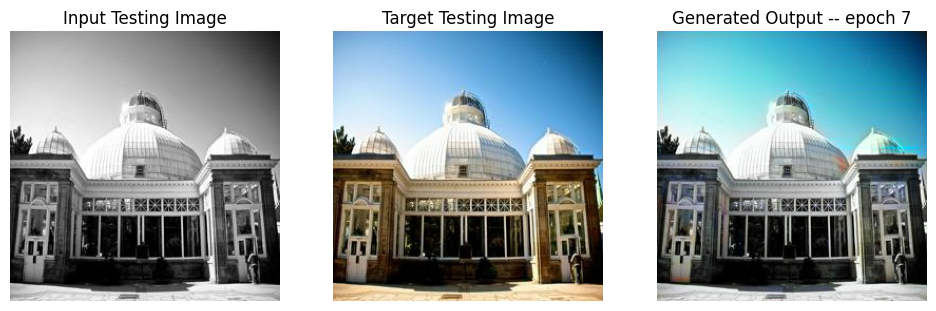

SSIM Score: 0.9284482002258301
PSNR Score: 22.865467071533203
Epoch 7
Training Details
Generator-- total_loss:8.85966 gan_loss:1.13662 l1_loss:0.04352 perceptual_loss:0.00796 Discriminator-- total_loss:1.20036 real_loss:0.57300 generated_loss:0.62736 --- SSIM 0.91762 PSNR 22.68275 LPIPS 0.00000
Time taken for epoch 8 is 599.4929659366608 sec
Number of iteration 500
Validation Details
Generator-- total_loss:16.83215 gan_loss:2.24779 l1_loss:0.08517  perceptual_loss:0.01206 Discriminator-- total_loss:1.23827 real_loss:0.32178 generated_loss:0.91649 --- SSIM 0.83248 PSNR 16.18254 LPIPS 0.00000
Time taken for epoch 8 is 639.8947715759277 sec
Number of iteration 63
Epoch 8
Training Details
Generator-- total_loss:8.86572 gan_loss:1.14272 l1_loss:0.04350 perceptual_loss:0.00798 Discriminator-- total_loss:1.18279 real_loss:0.56094 generated_loss:0.62186 --- SSIM 0.91724 PSNR 22.65824 LPIPS 0.00000
Time taken for epoch 9 is 600.7088944911957 sec
Number of iteration 500
Validation Details
Genera

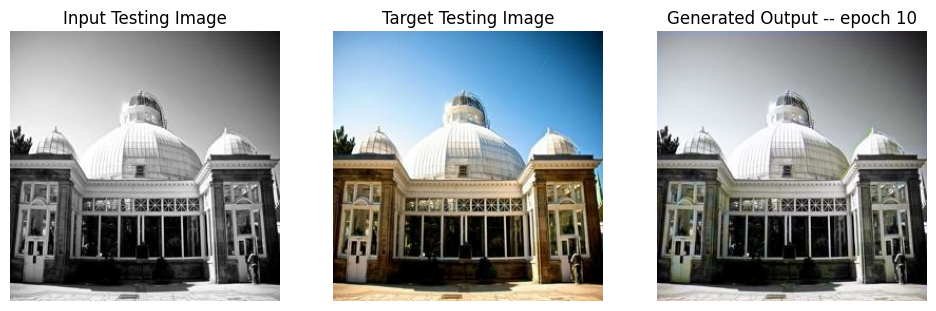

SSIM Score: 0.9389360547065735
PSNR Score: 19.176286697387695
Epoch 10
Training Details
Generator-- total_loss:7.02936 gan_loss:0.38373 l1_loss:0.03691 perceptual_loss:0.00739 Discriminator-- total_loss:1.94280 real_loss:1.43549 generated_loss:0.50732 --- SSIM 0.93932 PSNR 24.47176 LPIPS 0.00000
Time taken for epoch 11 is 540.7117691040039 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.75162 gan_loss:0.39294 l1_loss:0.04091  perceptual_loss:0.00815 Discriminator-- total_loss:1.98948 real_loss:1.31203 generated_loss:0.67745 --- SSIM 0.93967 PSNR 23.98435 LPIPS 0.00000
Time taken for epoch 11 is 580.3249554634094 sec
Number of iteration 63
Epoch 11
Training Details
Generator-- total_loss:17.11272 gan_loss:10.51772 l1_loss:0.03670 perceptual_loss:0.00726 Discriminator-- total_loss:0.05215 real_loss:0.02749 generated_loss:0.02466 --- SSIM 0.94025 PSNR 24.53582 LPIPS 0.00000
Time taken for epoch 12 is 411.6132493019104 sec
Number of iteration 500
Validation Details


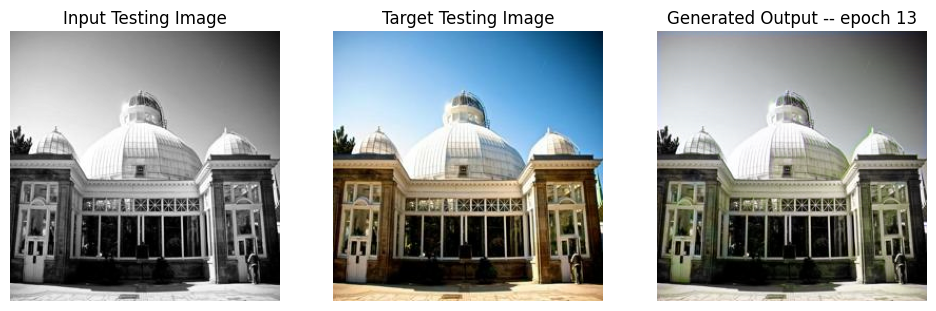

SSIM Score: 0.9419937133789062
PSNR Score: 19.287139892578125
Epoch 13
Training Details
Generator-- total_loss:20.78679 gan_loss:14.14128 l1_loss:0.03706 perceptual_loss:0.00725 Discriminator-- total_loss:0.00013 real_loss:0.00005 generated_loss:0.00009 --- SSIM 0.94012 PSNR 24.49613 LPIPS 0.00000
Time taken for epoch 14 is 393.58534932136536 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.39975 gan_loss:0.00970 l1_loss:0.04111  perceptual_loss:0.00815 Discriminator-- total_loss:6.07516 real_loss:6.07034 generated_loss:0.00482 --- SSIM 0.93658 PSNR 23.98341 LPIPS 0.00000
Time taken for epoch 14 is 433.7294111251831 sec
Number of iteration 63
Epoch 14
Training Details
Generator-- total_loss:20.40348 gan_loss:13.80725 l1_loss:0.03668 perceptual_loss:0.00730 Discriminator-- total_loss:0.00016 real_loss:0.00006 generated_loss:0.00010 --- SSIM 0.94091 PSNR 24.54708 LPIPS 0.00000
Time taken for epoch 15 is 392.7332673072815 sec
Number of iteration 500
Validation Detai

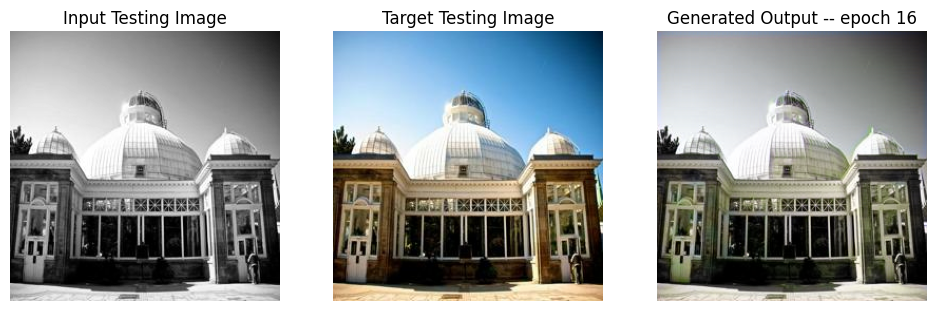

SSIM Score: 0.9419472217559814
PSNR Score: 19.284839630126953
Epoch 16
Training Details
Generator-- total_loss:22.53407 gan_loss:15.88768 l1_loss:0.03698 perceptual_loss:0.00733 Discriminator-- total_loss:0.00003 real_loss:0.00001 generated_loss:0.00002 --- SSIM 0.93990 PSNR 24.46488 LPIPS 0.00000
Time taken for epoch 17 is 393.63680505752563 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.30520 gan_loss:0.00267 l1_loss:0.04053  perceptual_loss:0.00815 Discriminator-- total_loss:7.85629 real_loss:7.85437 generated_loss:0.00192 --- SSIM 0.93970 PSNR 24.13426 LPIPS 0.00000
Time taken for epoch 17 is 434.2680115699768 sec
Number of iteration 63
Epoch 17
Training Details
Generator-- total_loss:23.13247 gan_loss:16.47191 l1_loss:0.03709 perceptual_loss:0.00731 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.93977 PSNR 24.43262 LPIPS 0.00000
Time taken for epoch 18 is 392.52808928489685 sec
Number of iteration 500
Validation Deta

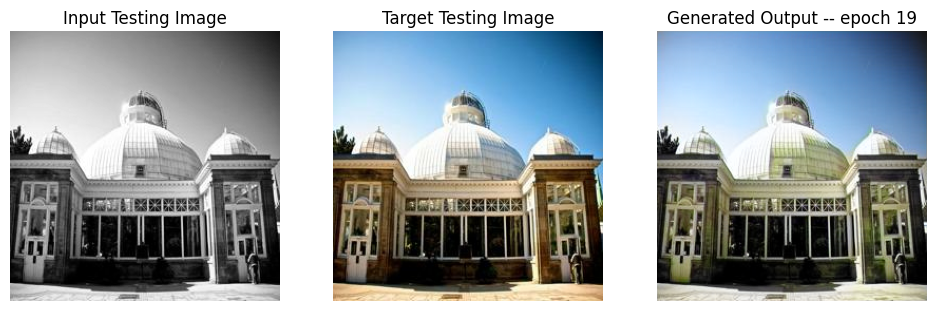

SSIM Score: 0.9603841304779053
PSNR Score: 25.765653610229492
Epoch 19
Training Details
Generator-- total_loss:6.51482 gan_loss:0.01832 l1_loss:0.03611 perceptual_loss:0.00720 Discriminator-- total_loss:7.97515 real_loss:7.97513 generated_loss:0.00001 --- SSIM 0.93976 PSNR 24.36936 LPIPS 0.00000
Time taken for epoch 20 is 531.4899237155914 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.15589 gan_loss:0.00008 l1_loss:0.03942  perceptual_loss:0.00828 Discriminator-- total_loss:12.15768 real_loss:12.15760 generated_loss:0.00008 --- SSIM 0.94425 PSNR 24.25958 LPIPS 0.00000
Time taken for epoch 20 is 571.7988414764404 sec
Number of iteration 63
Epoch 20
Training Details
Generator-- total_loss:6.38354 gan_loss:0.01544 l1_loss:0.03540 perceptual_loss:0.00705 Discriminator-- total_loss:7.92089 real_loss:7.92088 generated_loss:0.00001 --- SSIM 0.94196 PSNR 24.49297 LPIPS 0.00000
Time taken for epoch 21 is 530.2676589488983 sec
Number of iteration 500
Validation Details


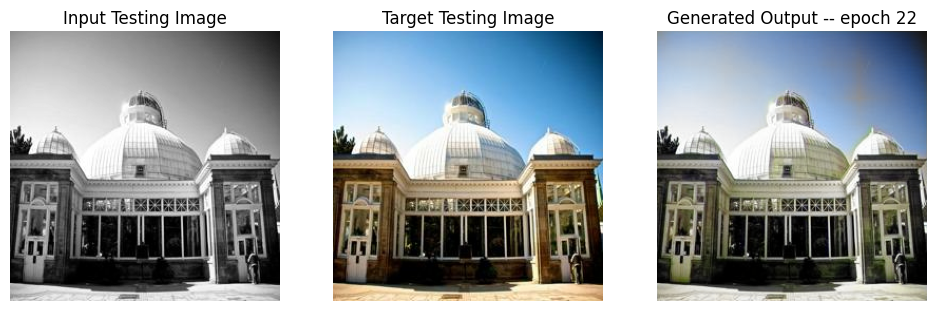

SSIM Score: 0.9553806781768799
PSNR Score: 23.247539520263672
Epoch 22
Training Details
Generator-- total_loss:6.38222 gan_loss:0.01498 l1_loss:0.03549 perceptual_loss:0.00696 Discriminator-- total_loss:7.84636 real_loss:7.84635 generated_loss:0.00001 --- SSIM 0.94219 PSNR 24.47491 LPIPS 0.00000
Time taken for epoch 23 is 530.3828492164612 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.40246 gan_loss:0.00007 l1_loss:0.04133  perceptual_loss:0.00802 Discriminator-- total_loss:12.61034 real_loss:12.61027 generated_loss:0.00008 --- SSIM 0.93900 PSNR 23.88367 LPIPS 0.00000
Time taken for epoch 23 is 570.5529191493988 sec
Number of iteration 63
Epoch 23
Training Details
Generator-- total_loss:6.40959 gan_loss:0.01523 l1_loss:0.03561 perceptual_loss:0.00702 Discriminator-- total_loss:7.85610 real_loss:7.85609 generated_loss:0.00001 --- SSIM 0.94209 PSNR 24.46471 LPIPS 0.00000
Time taken for epoch 24 is 529.2538576126099 sec
Number of iteration 500
Validation Details


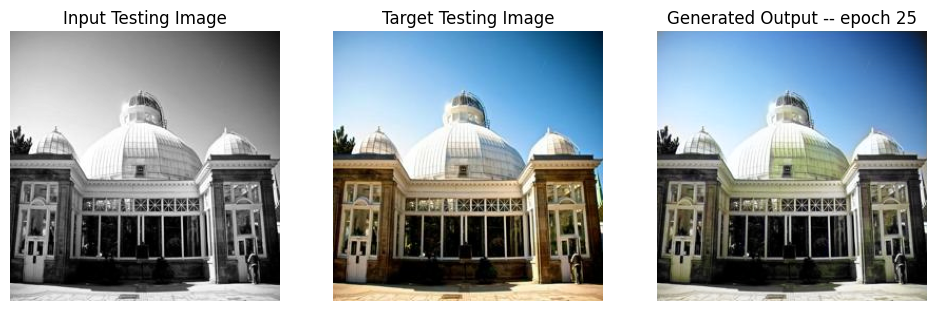

SSIM Score: 0.9629576802253723
PSNR Score: 26.34334945678711
Epoch 25
Training Details
Generator-- total_loss:6.37162 gan_loss:0.01494 l1_loss:0.03544 perceptual_loss:0.00694 Discriminator-- total_loss:7.86899 real_loss:7.86898 generated_loss:0.00001 --- SSIM 0.94227 PSNR 24.52117 LPIPS 0.00000
Time taken for epoch 26 is 531.0169625282288 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.03101 gan_loss:0.00007 l1_loss:0.03915  perceptual_loss:0.00772 Discriminator-- total_loss:12.38147 real_loss:12.38138 generated_loss:0.00009 --- SSIM 0.94268 PSNR 24.28072 LPIPS 0.00000
Time taken for epoch 26 is 572.0949354171753 sec
Number of iteration 63
Epoch 26
Training Details
Generator-- total_loss:6.34141 gan_loss:0.01430 l1_loss:0.03526 perceptual_loss:0.00692 Discriminator-- total_loss:7.92732 real_loss:7.92731 generated_loss:0.00001 --- SSIM 0.94258 PSNR 24.52260 LPIPS 0.00000
Time taken for epoch 27 is 527.9356081485748 sec
Number of iteration 500
Validation Details
G

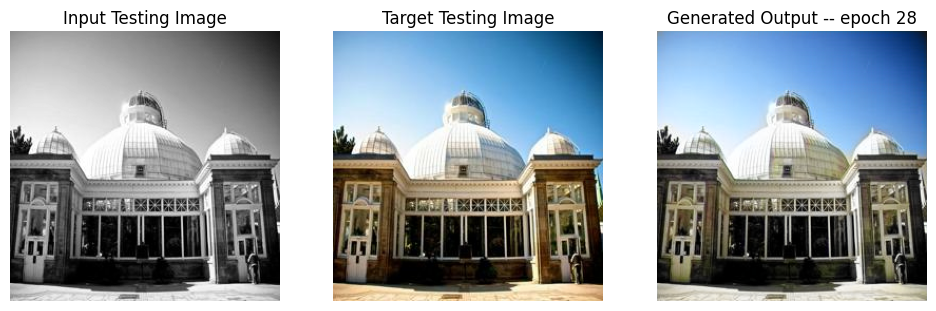

SSIM Score: 0.9644991755485535
PSNR Score: 26.7571964263916
Epoch 28
Training Details
Generator-- total_loss:15.64144 gan_loss:9.23534 l1_loss:0.03584 perceptual_loss:0.00686 Discriminator-- total_loss:0.01159 real_loss:0.00645 generated_loss:0.00514 --- SSIM 0.94167 PSNR 24.43840 LPIPS 0.00000
Time taken for epoch 29 is 393.950227022171 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.34600 gan_loss:0.36580 l1_loss:0.03911  perceptual_loss:0.00742 Discriminator-- total_loss:2.75791 real_loss:2.62781 generated_loss:0.13010 --- SSIM 0.94246 PSNR 24.18055 LPIPS 0.00000
Time taken for epoch 29 is 434.3046221733093 sec
Number of iteration 63
Epoch 29
Training Details
Generator-- total_loss:16.35001 gan_loss:9.98259 l1_loss:0.03561 perceptual_loss:0.00684 Discriminator-- total_loss:0.00153 real_loss:0.00075 generated_loss:0.00077 --- SSIM 0.94190 PSNR 24.47077 LPIPS 0.00000
Time taken for epoch 30 is 391.7995979785919 sec
Number of iteration 500
Validation Details
Gen

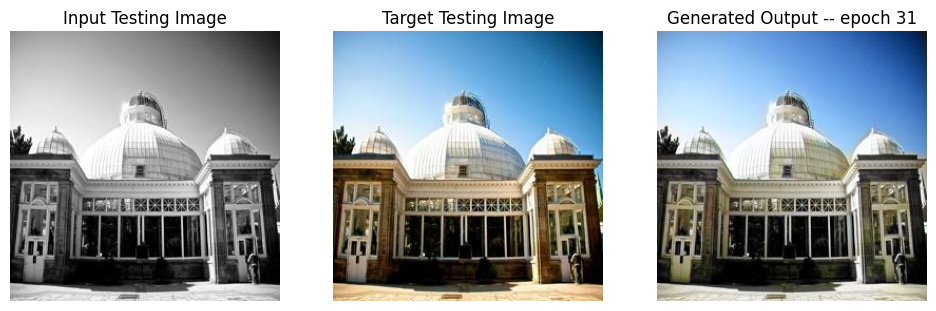

SSIM Score: 0.9647068977355957
PSNR Score: 26.802595138549805
Epoch 31
Training Details
Generator-- total_loss:18.07968 gan_loss:11.68726 l1_loss:0.03571 perceptual_loss:0.00690 Discriminator-- total_loss:0.01276 real_loss:0.00696 generated_loss:0.00580 --- SSIM 0.94122 PSNR 24.45003 LPIPS 0.00000
Time taken for epoch 32 is 393.99497056007385 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.44150 gan_loss:0.34420 l1_loss:0.03986  perceptual_loss:0.00746 Discriminator-- total_loss:3.18920 real_loss:3.08941 generated_loss:0.09979 --- SSIM 0.94276 PSNR 24.06792 LPIPS 0.00000
Time taken for epoch 32 is 434.08648657798767 sec
Number of iteration 63
Epoch 32
Training Details
Generator-- total_loss:17.68559 gan_loss:11.31909 l1_loss:0.03559 perceptual_loss:0.00685 Discriminator-- total_loss:0.00480 real_loss:0.00292 generated_loss:0.00188 --- SSIM 0.94155 PSNR 24.49629 LPIPS 0.00000
Time taken for epoch 33 is 393.29816126823425 sec
Number of iteration 500
Validation Det

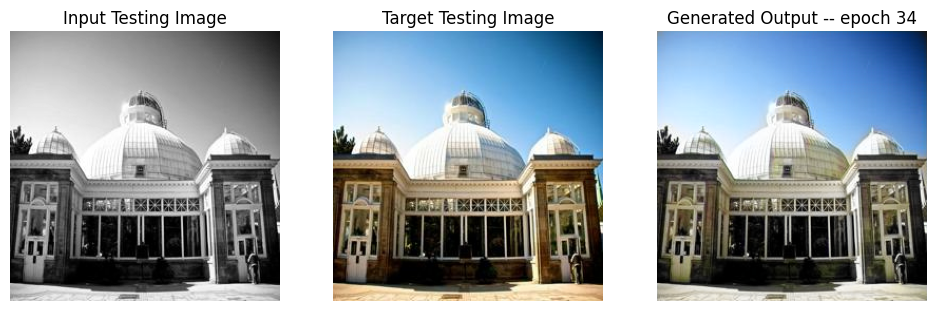

SSIM Score: 0.964678943157196
PSNR Score: 26.795711517333984
Reduced generator learning rate to 0.0002025000096182339 at epoch 34
Epoch 34
Training Details
Generator-- total_loss:6.69586 gan_loss:0.08817 l1_loss:0.03704 perceptual_loss:0.00701 Discriminator-- total_loss:8.27960 real_loss:8.27925 generated_loss:0.00035 --- SSIM 0.93791 PSNR 24.14058 LPIPS 0.00000
Time taken for epoch 35 is 528.6559896469116 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.43740 gan_loss:0.00017 l1_loss:0.04174  perceptual_loss:0.00784 Discriminator-- total_loss:15.05596 real_loss:15.05585 generated_loss:0.00011 --- SSIM 0.93489 PSNR 23.30783 LPIPS 0.00000
Time taken for epoch 35 is 568.8541703224182 sec
Number of iteration 63
Epoch 35
Training Details
Generator-- total_loss:6.57520 gan_loss:0.04417 l1_loss:0.03663 perceptual_loss:0.00691 Discriminator-- total_loss:8.34678 real_loss:8.34651 generated_loss:0.00027 --- SSIM 0.93926 PSNR 24.27166 LPIPS 0.00000
Time taken for epoch 36 

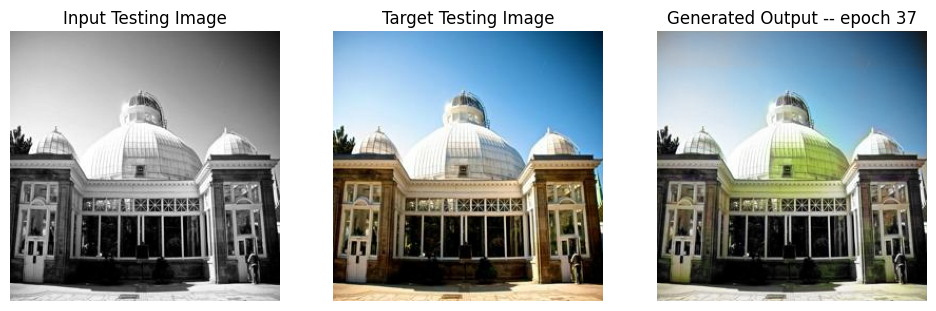

SSIM Score: 0.9576247334480286
PSNR Score: 23.909381866455078
Epoch 37
Training Details
Generator-- total_loss:6.55959 gan_loss:0.03901 l1_loss:0.03663 perceptual_loss:0.00684 Discriminator-- total_loss:8.10036 real_loss:8.09958 generated_loss:0.00079 --- SSIM 0.93889 PSNR 24.28123 LPIPS 0.00000
Time taken for epoch 38 is 527.4867656230927 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.64727 gan_loss:0.00027 l1_loss:0.04285  perceptual_loss:0.00813 Discriminator-- total_loss:13.11809 real_loss:13.11796 generated_loss:0.00013 --- SSIM 0.93631 PSNR 23.51220 LPIPS 0.00000
Time taken for epoch 38 is 568.018239736557 sec
Number of iteration 63
Epoch 38
Training Details
Generator-- total_loss:6.56706 gan_loss:0.03901 l1_loss:0.03664 perceptual_loss:0.00688 Discriminator-- total_loss:8.02543 real_loss:8.02474 generated_loss:0.00070 --- SSIM 0.93937 PSNR 24.29945 LPIPS 0.00000
Time taken for epoch 39 is 528.8662505149841 sec
Number of iteration 500
Validation Details
G

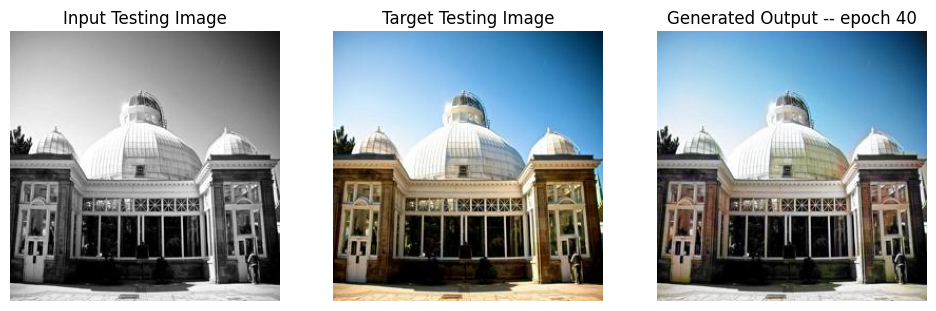

SSIM Score: 0.9620349407196045
PSNR Score: 26.59333038330078
Epoch 40
Training Details
Generator-- total_loss:6.51350 gan_loss:0.03785 l1_loss:0.03634 perceptual_loss:0.00683 Discriminator-- total_loss:7.91994 real_loss:7.91932 generated_loss:0.00062 --- SSIM 0.93890 PSNR 24.34658 LPIPS 0.00000
Time taken for epoch 41 is 527.9630165100098 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.49608 gan_loss:0.00009 l1_loss:0.04217  perceptual_loss:0.00780 Discriminator-- total_loss:17.36929 real_loss:17.36918 generated_loss:0.00011 --- SSIM 0.93858 PSNR 23.30673 LPIPS 0.00000
Time taken for epoch 41 is 567.5479371547699 sec
Number of iteration 63
Epoch 41
Training Details
Generator-- total_loss:6.54920 gan_loss:0.03729 l1_loss:0.03652 perceptual_loss:0.00689 Discriminator-- total_loss:7.84867 real_loss:7.84824 generated_loss:0.00043 --- SSIM 0.93900 PSNR 24.31071 LPIPS 0.00000
Time taken for epoch 42 is 526.8731973171234 sec
Number of iteration 500
Validation Details
G

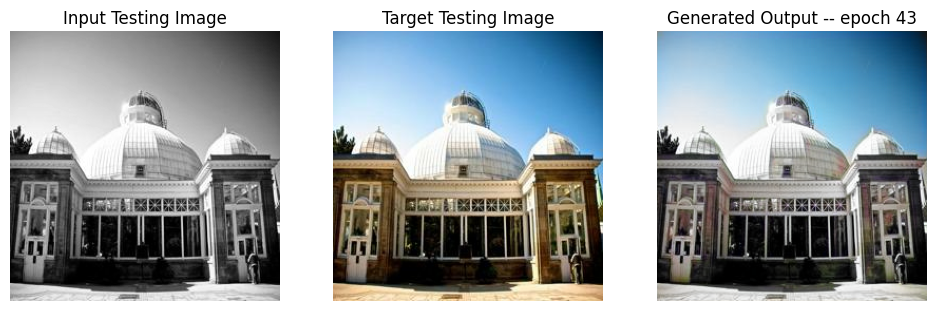

SSIM Score: 0.9609377384185791
PSNR Score: 25.50252914428711
Epoch 43
Training Details
Generator-- total_loss:6.48593 gan_loss:0.03625 l1_loss:0.03613 perceptual_loss:0.00687 Discriminator-- total_loss:7.86990 real_loss:7.86972 generated_loss:0.00018 --- SSIM 0.93999 PSNR 24.40323 LPIPS 0.00000
Time taken for epoch 44 is 538.0840590000153 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.31913 gan_loss:0.00022 l1_loss:0.04069  perceptual_loss:0.00810 Discriminator-- total_loss:12.23040 real_loss:12.23026 generated_loss:0.00014 --- SSIM 0.93976 PSNR 23.94044 LPIPS 0.00000
Time taken for epoch 44 is 579.5921573638916 sec
Number of iteration 63
Epoch 44
Training Details
Generator-- total_loss:6.54765 gan_loss:0.03591 l1_loss:0.03651 perceptual_loss:0.00690 Discriminator-- total_loss:7.72217 real_loss:7.72201 generated_loss:0.00016 --- SSIM 0.93863 PSNR 24.33537 LPIPS 0.00000
Time taken for epoch 45 is 534.6722648143768 sec
Number of iteration 500
Validation Details
G

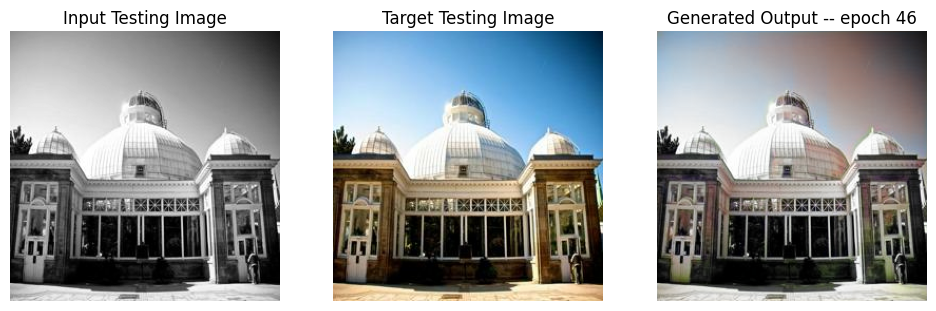

SSIM Score: 0.9359758496284485
PSNR Score: 18.577505111694336
Epoch 46
Training Details
Generator-- total_loss:6.50061 gan_loss:0.03662 l1_loss:0.03623 perceptual_loss:0.00686 Discriminator-- total_loss:7.70082 real_loss:7.70059 generated_loss:0.00023 --- SSIM 0.93910 PSNR 24.34629 LPIPS 0.00000
Time taken for epoch 47 is 536.3934667110443 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.13296 gan_loss:0.00024 l1_loss:0.03980  perceptual_loss:0.00775 Discriminator-- total_loss:13.41504 real_loss:13.41488 generated_loss:0.00016 --- SSIM 0.93997 PSNR 23.95584 LPIPS 0.00000
Time taken for epoch 47 is 576.6567459106445 sec
Number of iteration 63
Epoch 47
Training Details
Generator-- total_loss:6.54385 gan_loss:0.03441 l1_loss:0.03652 perceptual_loss:0.00687 Discriminator-- total_loss:7.70686 real_loss:7.70566 generated_loss:0.00120 --- SSIM 0.93840 PSNR 24.34414 LPIPS 0.00000
Time taken for epoch 48 is 536.0613622665405 sec
Number of iteration 500
Validation Details


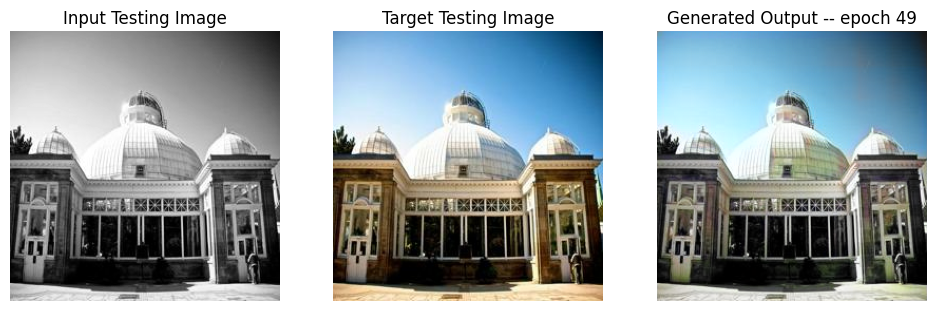

SSIM Score: 0.9543946385383606
PSNR Score: 24.543075561523438
Epoch 49
Training Details
Generator-- total_loss:6.48986 gan_loss:0.03410 l1_loss:0.03622 perceptual_loss:0.00682 Discriminator-- total_loss:7.73941 real_loss:7.73916 generated_loss:0.00025 --- SSIM 0.93904 PSNR 24.37416 LPIPS 0.00000
Time taken for epoch 50 is 534.8230030536652 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.23860 gan_loss:0.00021 l1_loss:0.04035  perceptual_loss:0.00791 Discriminator-- total_loss:12.82962 real_loss:12.82949 generated_loss:0.00013 --- SSIM 0.93881 PSNR 24.04324 LPIPS 0.00000
Time taken for epoch 50 is 575.2627391815186 sec
Number of iteration 63
Epoch 50
Training Details
Generator-- total_loss:6.49000 gan_loss:0.03544 l1_loss:0.03626 perceptual_loss:0.00677 Discriminator-- total_loss:7.61469 real_loss:7.61443 generated_loss:0.00026 --- SSIM 0.93932 PSNR 24.39304 LPIPS 0.00000
Time taken for epoch 51 is 536.3133411407471 sec
Number of iteration 500
Validation Details


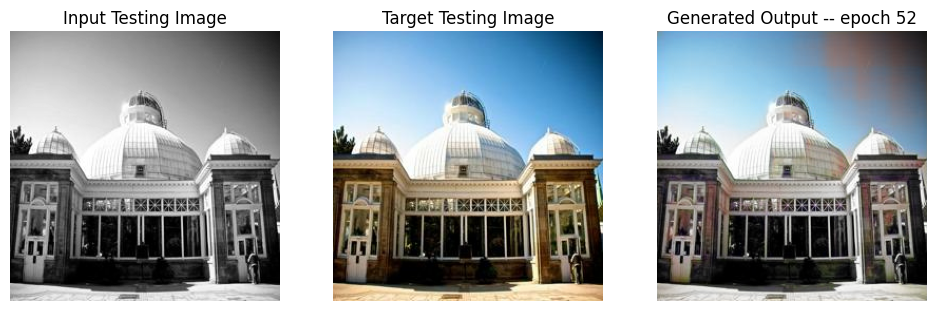

SSIM Score: 0.9409992694854736
PSNR Score: 21.493621826171875
Epoch 52
Training Details
Generator-- total_loss:6.50302 gan_loss:0.03308 l1_loss:0.03635 perceptual_loss:0.00679 Discriminator-- total_loss:7.71255 real_loss:7.71195 generated_loss:0.00060 --- SSIM 0.93889 PSNR 24.39496 LPIPS 0.00000
Time taken for epoch 53 is 536.696839094162 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.25181 gan_loss:0.00033 l1_loss:0.04056  perceptual_loss:0.00779 Discriminator-- total_loss:11.83892 real_loss:11.83878 generated_loss:0.00014 --- SSIM 0.94014 PSNR 23.93281 LPIPS 0.00000
Time taken for epoch 53 is 577.1567010879517 sec
Number of iteration 63
Epoch 53
Training Details
Generator-- total_loss:6.45579 gan_loss:0.03360 l1_loss:0.03606 perceptual_loss:0.00675 Discriminator-- total_loss:7.63364 real_loss:7.63346 generated_loss:0.00018 --- SSIM 0.93924 PSNR 24.43850 LPIPS 0.00000
Time taken for epoch 54 is 534.6939082145691 sec
Number of iteration 500
Validation Details
G

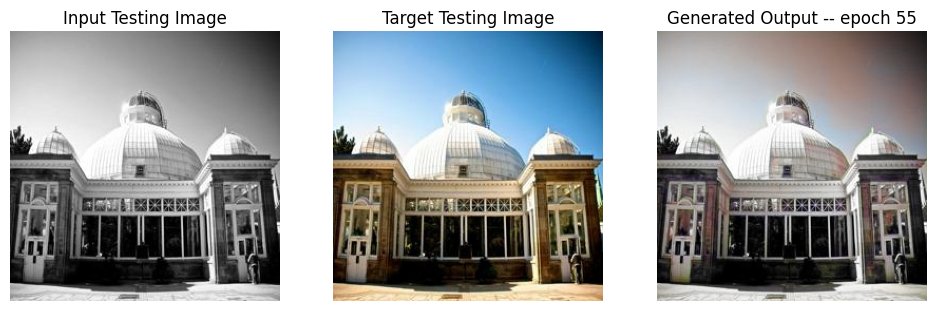

SSIM Score: 0.9339496493339539
PSNR Score: 18.065378189086914
Reduced discriminator learning rate to 9.000000427477062e-05 at epoch 55.
Epoch 55
Training Details
Generator-- total_loss:14.98864 gan_loss:8.60675 l1_loss:0.03579 perceptual_loss:0.00675 Discriminator-- total_loss:0.03458 real_loss:0.02046 generated_loss:0.01412 --- SSIM 0.94009 PSNR 24.47808 LPIPS 0.00000
Time taken for epoch 56 is 398.0374960899353 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.17433 gan_loss:0.01308 l1_loss:0.04005  perceptual_loss:0.00770 Discriminator-- total_loss:6.81848 real_loss:6.80420 generated_loss:0.01428 --- SSIM 0.94006 PSNR 24.05931 LPIPS 0.00000
Time taken for epoch 56 is 438.2307093143463 sec
Number of iteration 63
Epoch 56
Training Details
Generator-- total_loss:16.46258 gan_loss:10.03590 l1_loss:0.03607 perceptual_loss:0.00677 Discriminator-- total_loss:0.00504 real_loss:0.00225 generated_loss:0.00280 --- SSIM 0.93991 PSNR 24.43738 LPIPS 0.00000
Time taken for ep

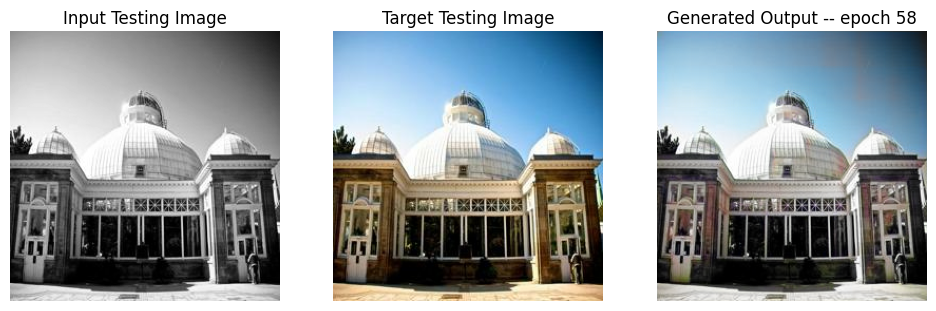

SSIM Score: 0.9533207416534424
PSNR Score: 23.510942459106445
Epoch 58
Training Details
Generator-- total_loss:16.76805 gan_loss:10.34755 l1_loss:0.03606 perceptual_loss:0.00674 Discriminator-- total_loss:0.00619 real_loss:0.00234 generated_loss:0.00385 --- SSIM 0.93991 PSNR 24.47176 LPIPS 0.00000
Time taken for epoch 59 is 397.73857283592224 sec
Number of iteration 500
Validation Details
Generator-- total_loss:6.92642 gan_loss:0.00297 l1_loss:0.03883  perceptual_loss:0.00732 Discriminator-- total_loss:8.59888 real_loss:8.59630 generated_loss:0.00258 --- SSIM 0.94310 PSNR 24.27988 LPIPS 0.00000
Time taken for epoch 59 is 438.1661858558655 sec
Number of iteration 63
Epoch 59
Training Details
Generator-- total_loss:18.32003 gan_loss:11.88099 l1_loss:0.03610 perceptual_loss:0.00682 Discriminator-- total_loss:0.00094 real_loss:0.00030 generated_loss:0.00064 --- SSIM 0.93934 PSNR 24.43394 LPIPS 0.00000
Time taken for epoch 60 is 398.69815135002136 sec
Number of iteration 500
Validation Deta

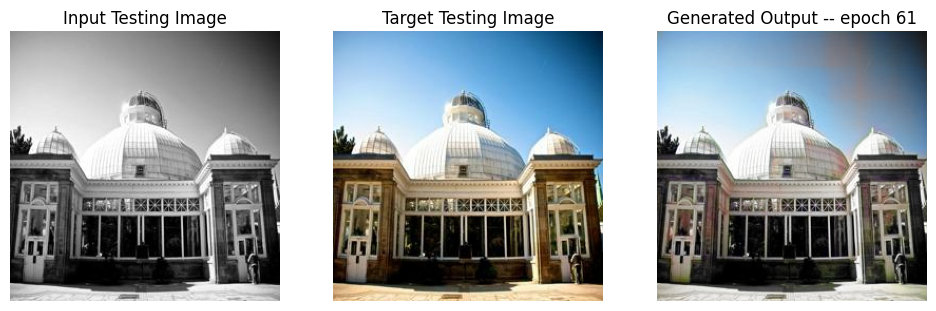

SSIM Score: 0.9489850997924805
PSNR Score: 22.582637786865234
Epoch 61
Training Details
Generator-- total_loss:6.62089 gan_loss:0.03721 l1_loss:0.03691 perceptual_loss:0.00698 Discriminator-- total_loss:7.06320 real_loss:7.06252 generated_loss:0.00068 --- SSIM 0.93735 PSNR 24.21460 LPIPS 0.00000
Time taken for epoch 62 is 535.0519392490387 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.53725 gan_loss:0.00007 l1_loss:0.04236  perceptual_loss:0.00789 Discriminator-- total_loss:13.77634 real_loss:13.77625 generated_loss:0.00008 --- SSIM 0.93523 PSNR 23.46848 LPIPS 0.00000
Time taken for epoch 62 is 576.2122304439545 sec
Number of iteration 63
Epoch 62
Training Details
Generator-- total_loss:6.61620 gan_loss:0.03669 l1_loss:0.03694 perceptual_loss:0.00693 Discriminator-- total_loss:6.95298 real_loss:6.95155 generated_loss:0.00144 --- SSIM 0.93746 PSNR 24.23274 LPIPS 0.00000
Time taken for epoch 63 is 535.1361145973206 sec
Number of iteration 500
Validation Details


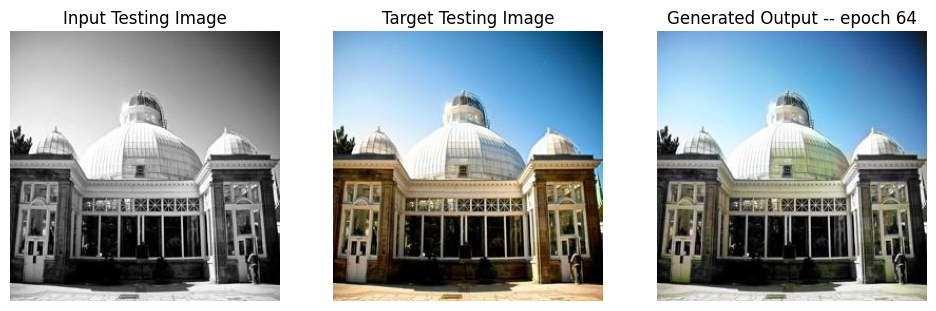

SSIM Score: 0.959557294845581
PSNR Score: 26.318790435791016
Epoch 64
Training Details
Generator-- total_loss:6.54734 gan_loss:0.03542 l1_loss:0.03645 perceptual_loss:0.00696 Discriminator-- total_loss:6.77482 real_loss:6.77289 generated_loss:0.00193 --- SSIM 0.93782 PSNR 24.26724 LPIPS 0.00000
Time taken for epoch 65 is 562.1041610240936 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.13302 gan_loss:0.00010 l1_loss:0.03956  perceptual_loss:0.00800 Discriminator-- total_loss:12.84300 real_loss:12.84290 generated_loss:0.00009 --- SSIM 0.93973 PSNR 24.12953 LPIPS 0.00000
Time taken for epoch 65 is 602.1545209884644 sec
Number of iteration 63
Epoch 65
Training Details
Generator-- total_loss:6.57581 gan_loss:0.03802 l1_loss:0.03664 perceptual_loss:0.00695 Discriminator-- total_loss:6.83337 real_loss:6.83115 generated_loss:0.00222 --- SSIM 0.93656 PSNR 24.24403 LPIPS 0.00000
Time taken for epoch 66 is 526.2680592536926 sec
Number of iteration 500
Validation Details
G

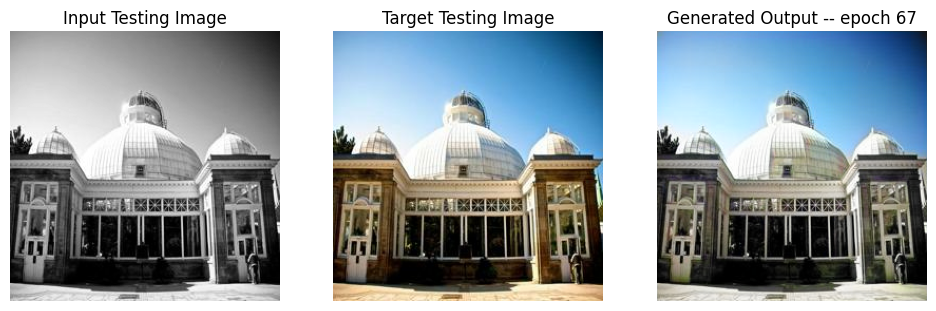

SSIM Score: 0.96103835105896
PSNR Score: 26.64577865600586
Epoch 67
Training Details
Generator-- total_loss:6.56315 gan_loss:0.03363 l1_loss:0.03662 perceptual_loss:0.00691 Discriminator-- total_loss:6.65042 real_loss:6.64762 generated_loss:0.00280 --- SSIM 0.93663 PSNR 24.25147 LPIPS 0.00000
Time taken for epoch 68 is 526.658374786377 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.29344 gan_loss:0.00011 l1_loss:0.04098  perceptual_loss:0.00764 Discriminator-- total_loss:13.16545 real_loss:13.16532 generated_loss:0.00013 --- SSIM 0.93768 PSNR 23.68928 LPIPS 0.00000
Time taken for epoch 68 is 565.8631625175476 sec
Number of iteration 63
Epoch 68
Training Details
Generator-- total_loss:6.51280 gan_loss:0.03502 l1_loss:0.03633 perceptual_loss:0.00686 Discriminator-- total_loss:6.67290 real_loss:6.67265 generated_loss:0.00025 --- SSIM 0.93779 PSNR 24.32759 LPIPS 0.00000
Time taken for epoch 69 is 529.5400106906891 sec
Number of iteration 500
Validation Details
Gene

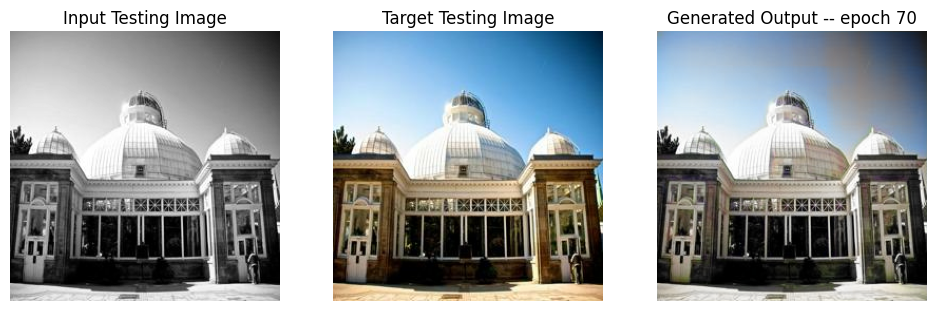

SSIM Score: 0.946796178817749
PSNR Score: 21.58939552307129
Epoch 70
Training Details
Generator-- total_loss:6.52886 gan_loss:0.03536 l1_loss:0.03641 perceptual_loss:0.00688 Discriminator-- total_loss:6.41072 real_loss:6.41039 generated_loss:0.00033 --- SSIM 0.93706 PSNR 24.27331 LPIPS 0.00000
Time taken for epoch 71 is 527.7913897037506 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.56149 gan_loss:0.00009 l1_loss:0.04261  perceptual_loss:0.00780 Discriminator-- total_loss:13.82744 real_loss:13.82734 generated_loss:0.00010 --- SSIM 0.93306 PSNR 23.35393 LPIPS 0.00000
Time taken for epoch 71 is 567.5895662307739 sec
Number of iteration 63
Epoch 71
Training Details
Generator-- total_loss:6.50771 gan_loss:0.03305 l1_loss:0.03626 perceptual_loss:0.00691 Discriminator-- total_loss:6.43158 real_loss:6.43140 generated_loss:0.00018 --- SSIM 0.93802 PSNR 24.30633 LPIPS 0.00000
Time taken for epoch 72 is 528.7004826068878 sec
Number of iteration 500
Validation Details
Ge

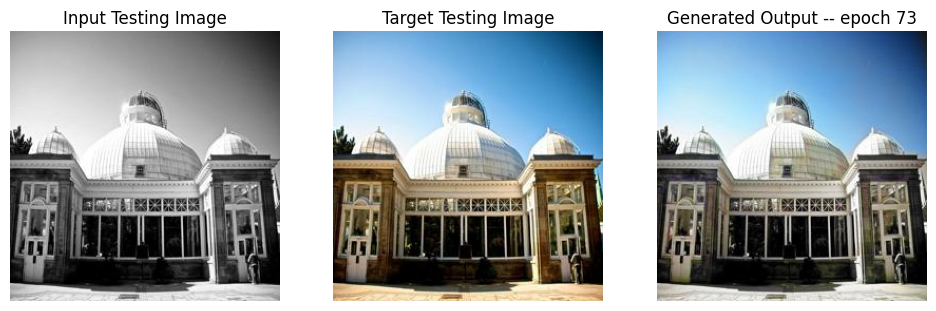

SSIM Score: 0.9603889584541321
PSNR Score: 26.288694381713867
Epoch 73
Training Details
Generator-- total_loss:6.55960 gan_loss:0.03347 l1_loss:0.03652 perceptual_loss:0.00699 Discriminator-- total_loss:6.35543 real_loss:6.34525 generated_loss:0.01017 --- SSIM 0.93722 PSNR 24.25853 LPIPS 0.00000
Time taken for epoch 74 is 526.6781203746796 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.24636 gan_loss:0.00010 l1_loss:0.04065  perceptual_loss:0.00766 Discriminator-- total_loss:13.26678 real_loss:13.26668 generated_loss:0.00010 --- SSIM 0.93851 PSNR 23.95981 LPIPS 0.00000
Time taken for epoch 74 is 566.2596707344055 sec
Number of iteration 63
Epoch 74
Training Details
Generator-- total_loss:6.52137 gan_loss:0.03390 l1_loss:0.03637 perceptual_loss:0.00688 Discriminator-- total_loss:6.44432 real_loss:6.44394 generated_loss:0.00037 --- SSIM 0.93695 PSNR 24.30178 LPIPS 0.00000
Time taken for epoch 75 is 528.4567737579346 sec
Number of iteration 500
Validation Details


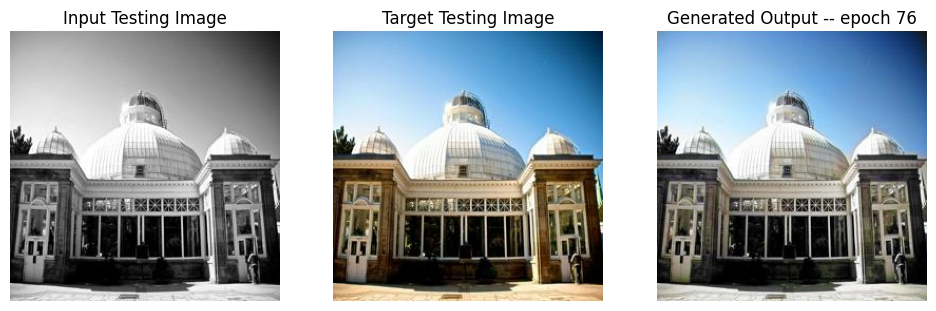

SSIM Score: 0.9610339999198914
PSNR Score: 26.18607521057129


In [50]:
fit(train_dataset, epochs, val, gen)

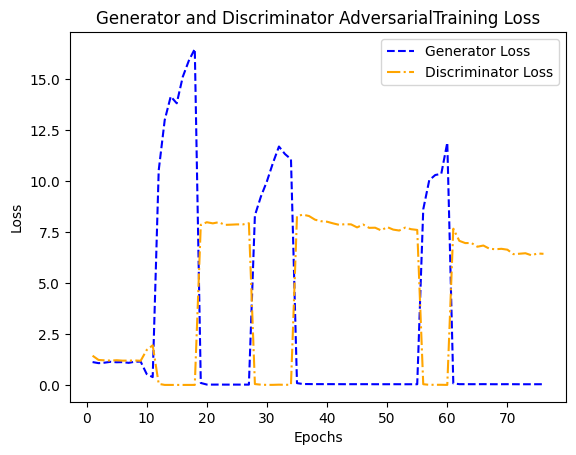

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

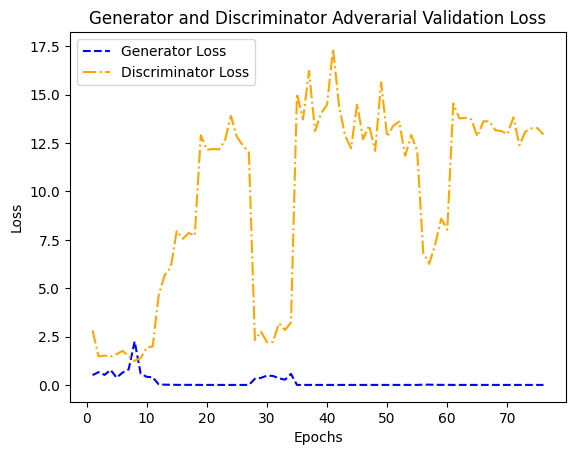

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

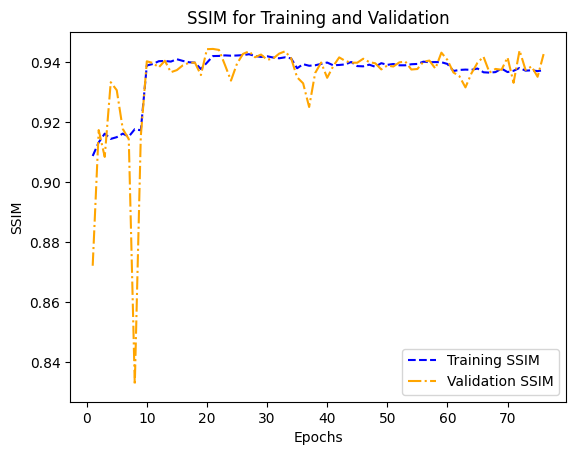

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

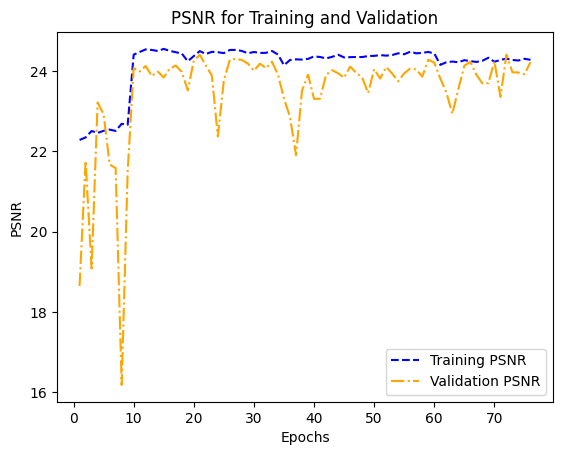

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

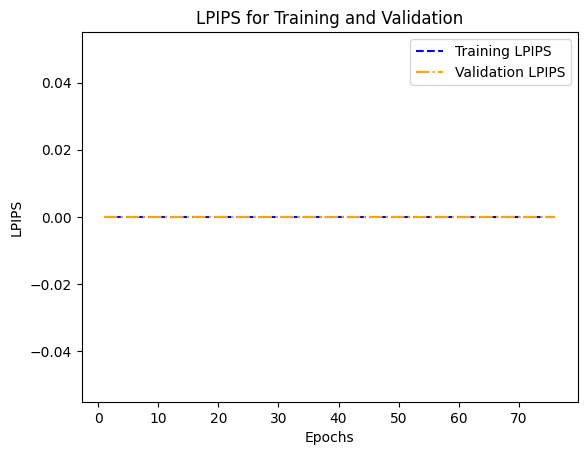

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

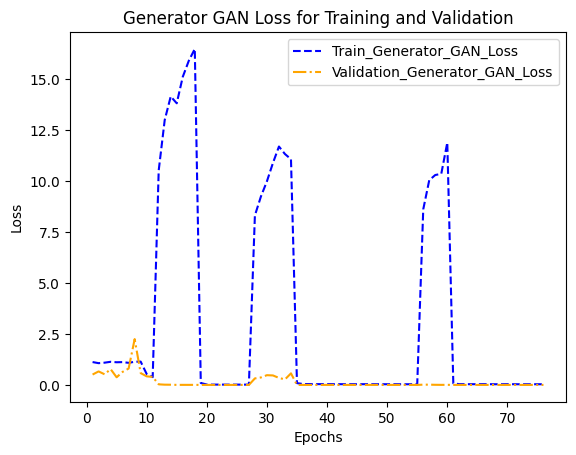

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

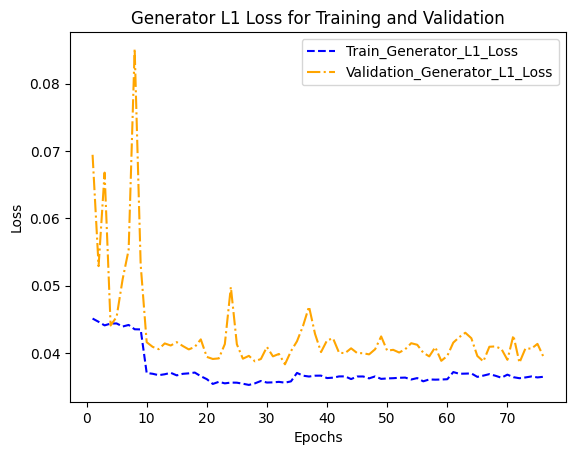

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

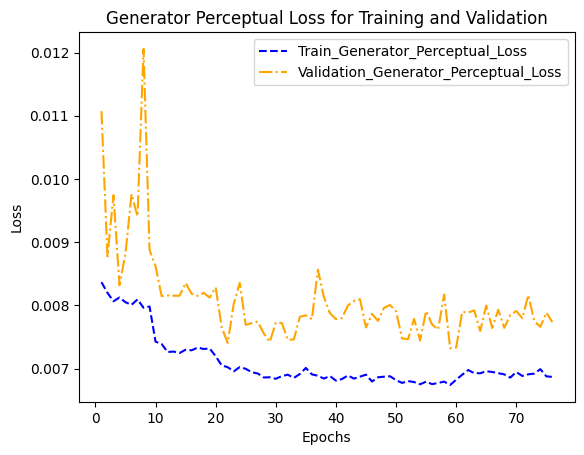

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

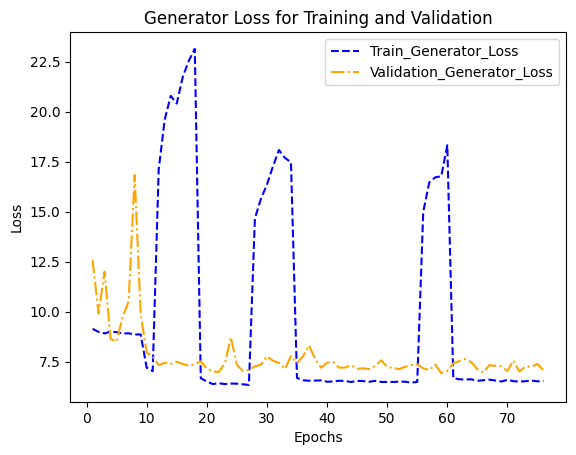

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

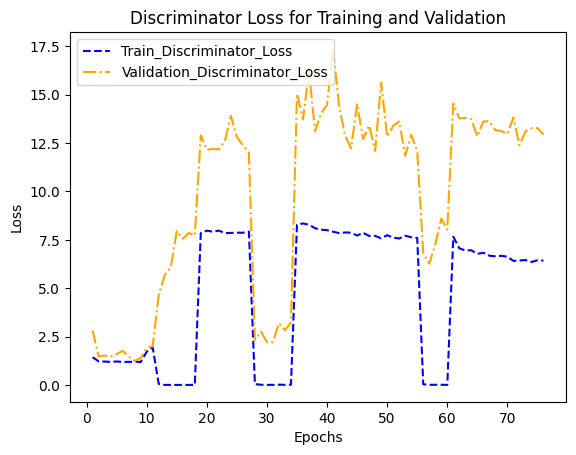

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

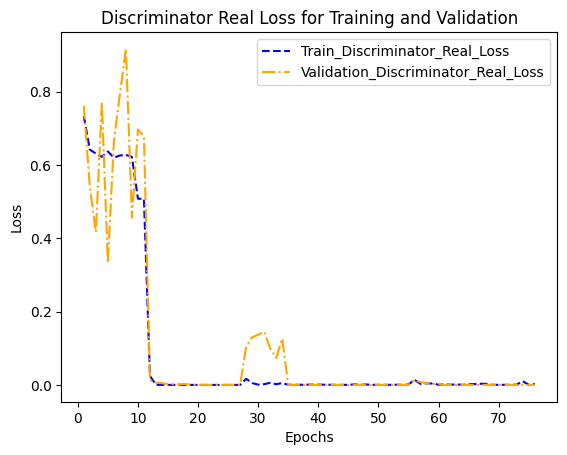

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

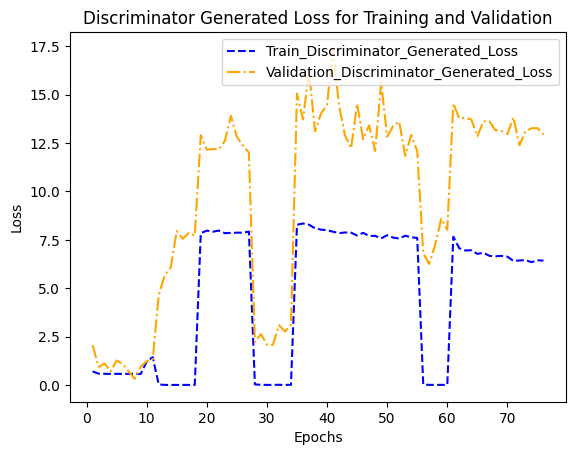

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb7')

In [66]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip